# Playing Cards Object Detection

### Importing Required Libraries

In [1]:
import os  # OS operations like file handling
import random  # Random number generation
import pandas as pd  # Data manipulation
from PIL import Image  # Image processing
import cv2  # Computer vision tasks
from IPython.display import Video  # Display videos in Jupyter notebooks
import numpy as np  # Numerical computations
import matplotlib.pyplot as plt  # Plotting graphs and visualizations
import seaborn as sns  # Statistical data visualizations
sns.set(style='darkgrid')
import pathlib  # File system paths handling
import glob  # File pattern matching (e.g., search for files)
from tqdm.notebook import trange, tqdm  # Progress bars in notebooks
import warnings  # Manage warning messages
warnings.filterwarnings('ignore')

In [2]:
# Install the Ultralytics YOLO package, which provides implementations of the YOLO object detection models.
!pip install ultralytics
from ultralytics import YOLO

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 886.3/886.3 kB 18.1 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
!pip install --upgrade ultralytics ray

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.3/66.3 MB 9.6 MB/s eta 0:00:00


### Importing the Dataset from Kaggle

In [4]:
%mkdir /content/my_datasets

In [5]:
!kaggle datasets download -d andy8744/playing-cards-object-detection-dataset -p /content/my_datasets/

Dataset URL: https://www.kaggle.com/datasets/andy8744/playing-cards-object-detection-dataset
License(s): CC0-1.0
 98% 662M/674M [00:09<00:00, 97.6MB/s]
100% 674M/674M [00:09<00:00, 72.6MB/s]


In [6]:
!unzip /content/my_datasets/playing-cards-object-detection-dataset.zip -d /content/my_datasets/

Streaming output truncated to the last 5000 lines.
  inflating: /content/my_datasets/valid/images/752527280_jpg.rf.1190e1a64bf65eed36d1d1cba0ac89e0.jpg  
  inflating: /content/my_datasets/valid/images/752545673_jpg.rf.a60febd8226453d8a31f23bc95066bdf.jpg  
  inflating: /content/my_datasets/valid/images/753807313_jpg.rf.9e64e6e8fa656d8c60c8320758310111.jpg  
  inflating: /content/my_datasets/valid/images/753832832_jpg.rf.9d7c237e032adf4e7d675dfc6ab89ca0.jpg  
  inflating: /content/my_datasets/valid/images/753940151_jpg.rf.1faa4fd0ad6dce6f54cc9a0cca492819.jpg  
  inflating: /content/my_datasets/valid/images/754592338_jpg.rf.84afe9ef94ca63180e1a6010b537a3d5.jpg  
  inflating: /content/my_datasets/valid/images/755541347_jpg.rf.9a3eff745a4c8e98256b2a33a5be770a.jpg  
  inflating: /content/my_datasets/valid/images/756343422_jpg.rf.01a496d12ada09d5d2855a62bdbeba52.jpg  
  inflating: /content/my_datasets/valid/images/756346191_jpg.rf.deebe7514e878a1ed73af16ee8cf0184.jpg  
  inflating: /content/

### Data Visualization

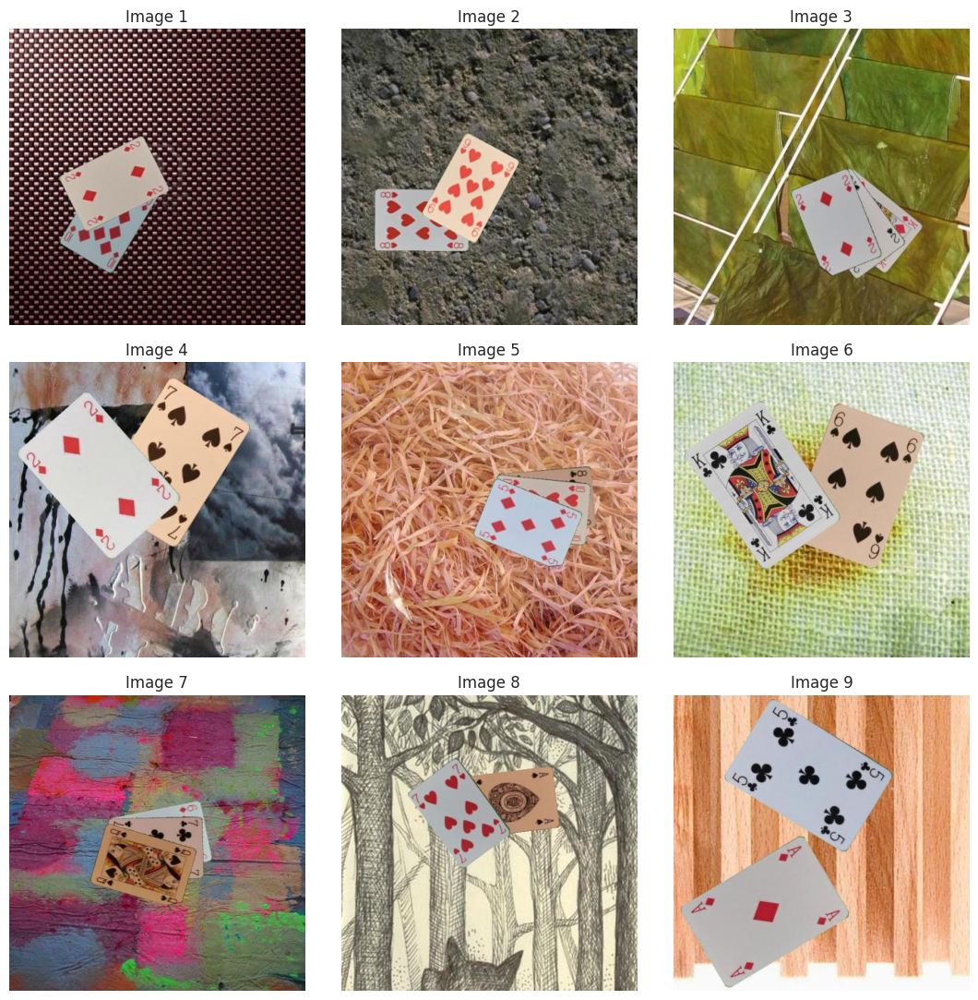

In [7]:
training_images_dir = '/content/my_datasets/train/images'
num_samples = 9
image_files = os.listdir(training_images_dir)
rand_images = random.sample(image_files, num_samples) # Display 9 random images

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(training_images_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

### Data Shape

In [8]:
for image in rand_images:
    img_path = os.path.join(training_images_dir, image)
    img = plt.imread(img_path)
    print(f"{image}: {img.shape}")  # Print image name and shape

120619265_jpg.rf.bd8b5c23e08dbfb794356763a6347fde.jpg: (416, 416, 3)
081959727_jpg.rf.6abe31351a0761f70a02e0a048b02766.jpg: (416, 416, 3)
781715492_jpg.rf.ff0db2333fb63ccb3fc6bbefa7c65645.jpg: (416, 416, 3)
497180016_jpg.rf.a6c65d778585dcd9a32a8aeb0d991333.jpg: (416, 416, 3)
691287411_jpg.rf.ebd92877f288d76ae169d13ecd4e0470.jpg: (416, 416, 3)
165872604_jpg.rf.ff1dc7bcfe9c8af5384e3753c23877ea.jpg: (416, 416, 3)
587229973_jpg.rf.d765782b74067fb19c9bccde27f6e0c4.jpg: (416, 416, 3)
072559196_jpg.rf.d5afa018c1a5198a8d36b2862e29ec85.jpg: (416, 416, 3)
893560807_jpg.rf.6df4d88199ec17fd17e09a042c9e2c6e.jpg: (416, 416, 3)


### Using YOLO Pre-Trained Model

In [9]:
model = YOLO('yolov5n.pt')

PRO TIP 💡 Replace 'model=yolov5n.pt' with new 'model=yolov5nu.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 5.31M/5.31M [00:00<00:00, 238MB/s]


### Training Model

In [11]:
Result_model = model.train(data="/content/my_datasets/kaggle_data.yaml",epochs = 1, batch = -1, optimizer = 'auto')

Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov5n.pt, data=/content/my_datasets/kaggle_data.yaml, epochs=1, time=None, patience=100, batch=-1, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, sh

100%|██████████| 755k/755k [00:00<00:00, 63.2MB/s]


Overriding model.yaml nc=80 with nc=52

                   from  n    params  module                                       arguments                     
  0                  -1  1      1760  ultralytics.nn.modules.conv.Conv             [3, 16, 6, 2, 2]              
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      4800  ultralytics.nn.modules.block.C3              [32, 32, 1]                   
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     29184  ultralytics.nn.modules.block.C3              [64, 64, 2]                   
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  3    156928  ultralytics.nn.modules.block.C3              [128, 128, 3]                 
  7                  -1  1    295424  ultralytic

train: Scanning /content/my_datasets/train/labels... 14000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 14000/14000 [00:09<00:00, 1483.81it/s]


train: New cache created: /content/my_datasets/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch:  ⚠️ intended for CUDA devices, using default batch-size 16


train: Scanning /content/my_datasets/train/labels.cache... 14000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 14000/14000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/my_datasets/valid/labels... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:02<00:00, 1623.89it/s]


val: New cache created: /content/my_datasets/valid/labels.cache
Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G      1.226      4.482     0.9993         86        640: 100%|██████████| 875/875 [2:49:31<00:00, 11.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [20:48<00:00,  9.99s/it]


                   all       4000      15159     0.0769      0.175     0.0626     0.0509

1 epochs completed in 3.176 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.3MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.3MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv5n summary (fused): 193 layers, 2,513,084 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [17:40<00:00,  8.49s/it]


                   all       4000      15159     0.0772      0.175     0.0626     0.0509
                   10c        180        282      0.117      0.188     0.0776     0.0611
                   10d        188        290     0.0878     0.0724     0.0581      0.047
                   10h        201        322     0.0841      0.196     0.0622     0.0478
                   10s        165        250       0.14      0.276      0.122     0.0917
                    2c        193        295     0.0312     0.0644     0.0295     0.0246
                    2d        167        259     0.0364      0.135     0.0301     0.0254
                    2h        187        294     0.0313      0.126     0.0357     0.0292
                    2s        192        299     0.0302     0.0435     0.0257     0.0217
                    3c        201        308     0.0332     0.0909     0.0355     0.0296
                    3d        167        250      0.052      0.152     0.0455     0.0369
                    3

### Performance Analysis

In [14]:
# Function for displaying the key metrics (confusion_matrix, f1, precision, recall....)
def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(20, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

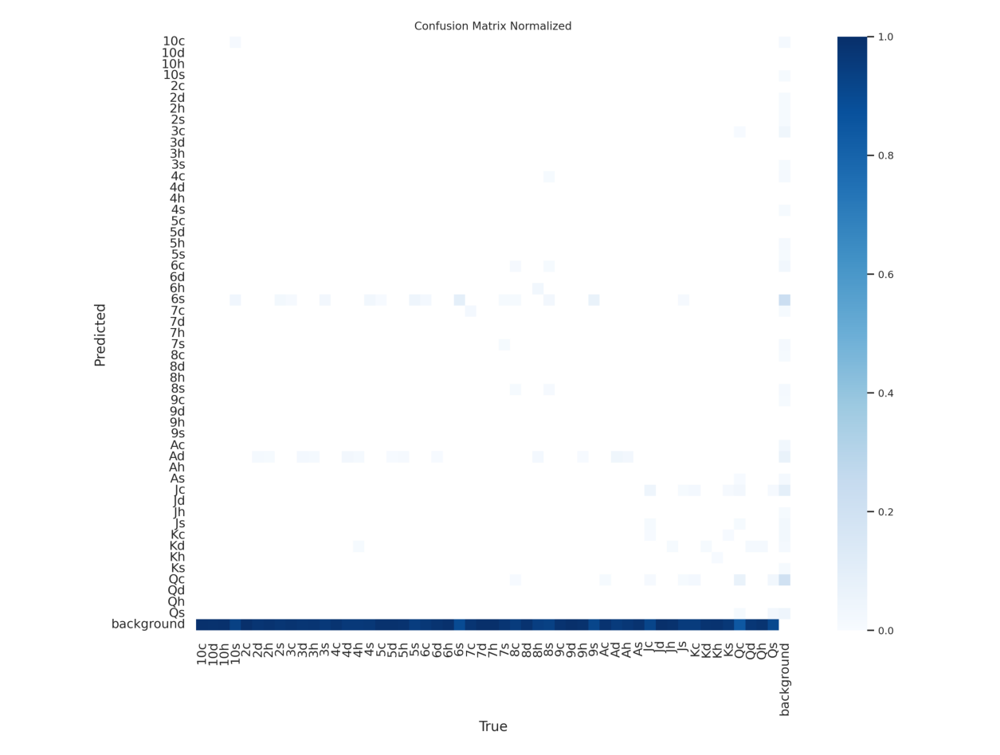

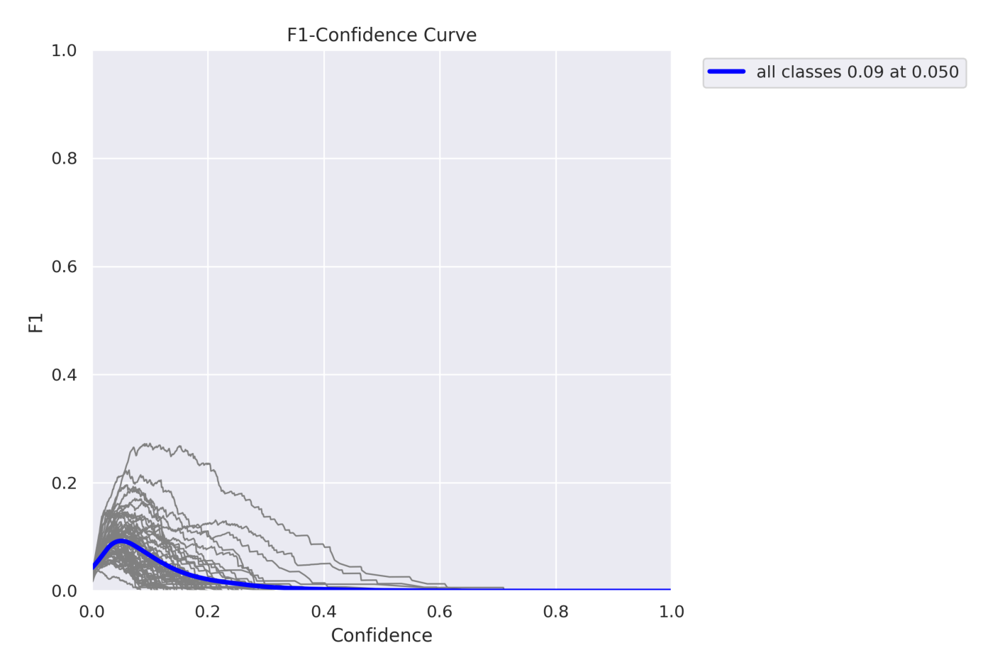

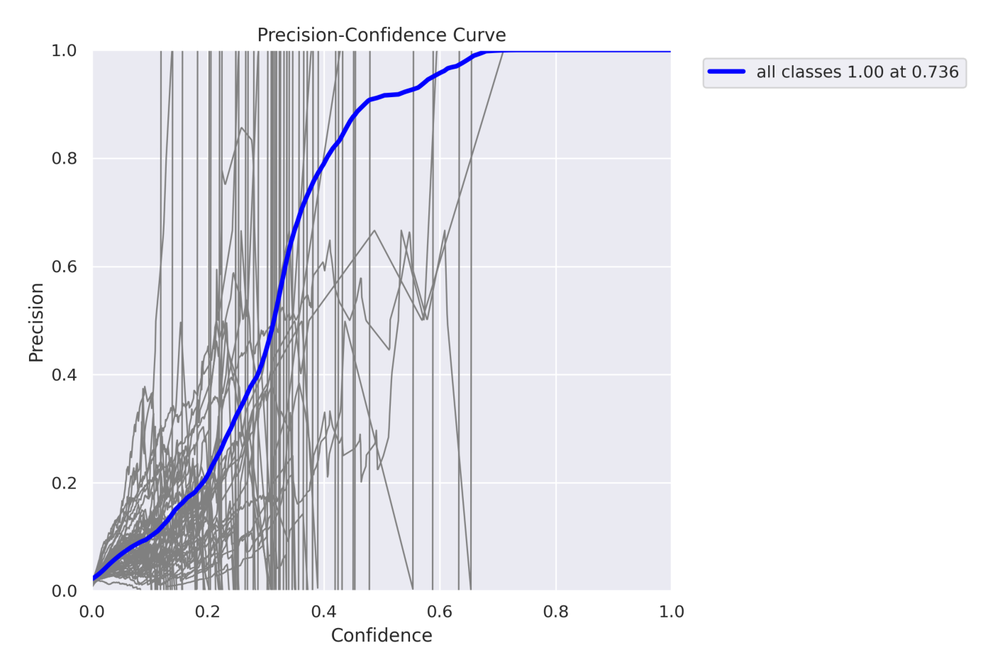

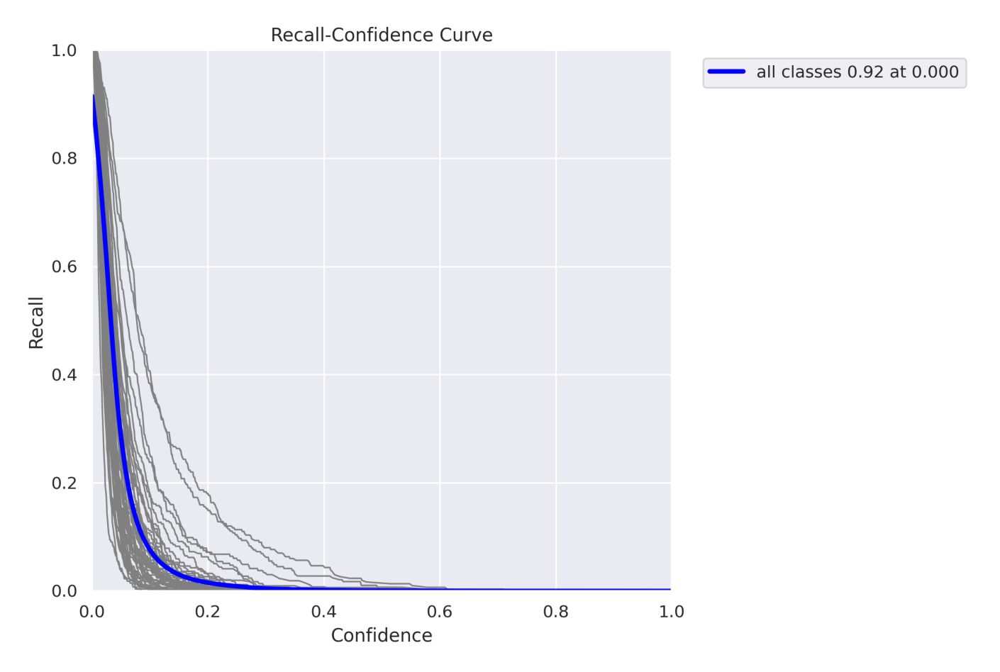

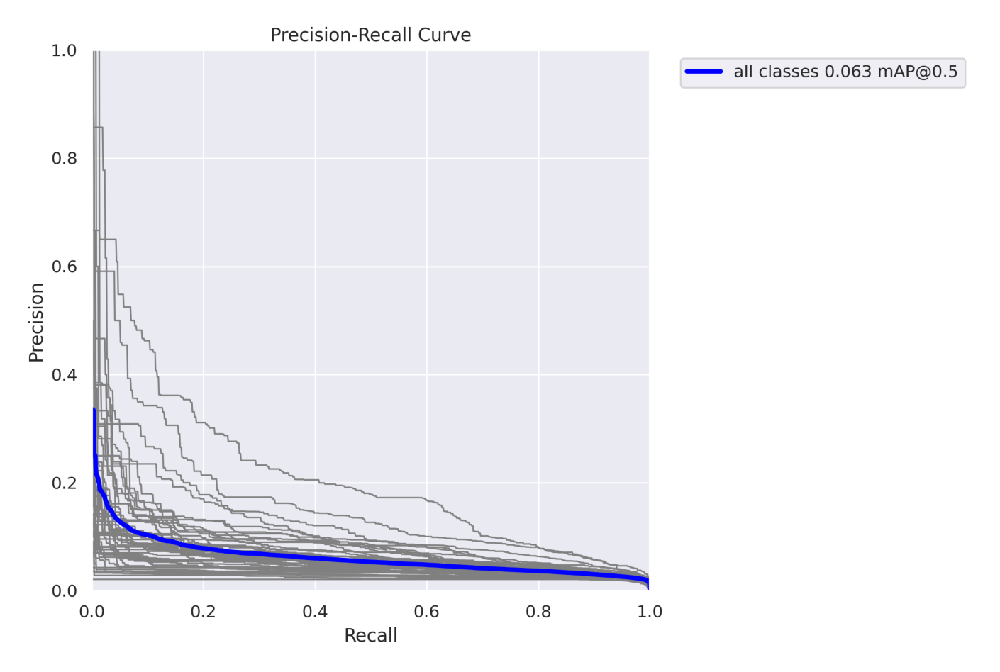

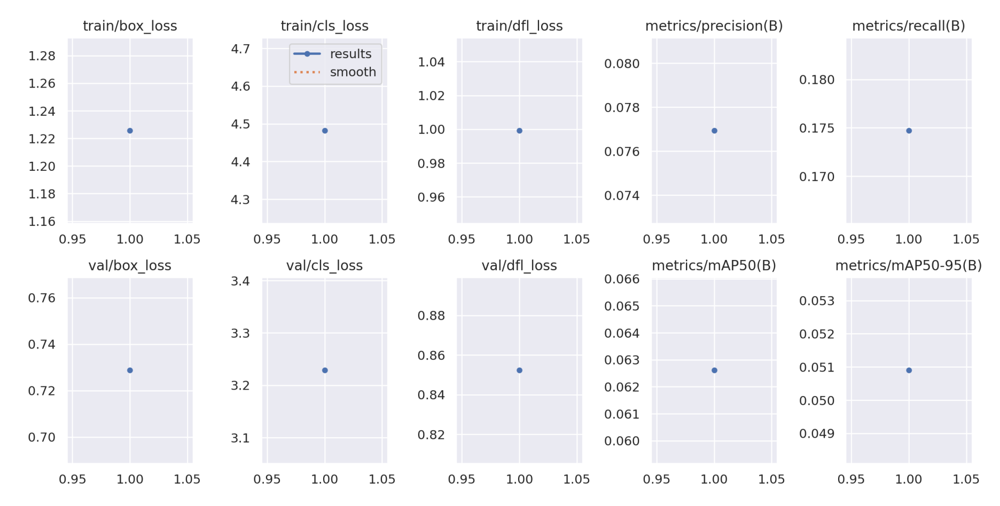

In [16]:
# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',  #precision
    'R_curve.png',  #recall
    'PR_curve.png', #precision/recall
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = '/content/runs/detect/train2'

# Display the images
display_images(post_training_files_path, image_files)

Note: Model Confidence Low due to 1 Epoch, increase Epochs for better confidence

In [17]:
#Reading results from the csv
Result_Final_model = pd.read_csv('/content/runs/detect/train2/results.csv')
Result_Final_model.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,11434.5,1.22576,4.48238,0.99926,0.07694,0.17472,0.06261,0.0509,0.72873,3.22862,0.85232,0.00006,0.00006,0.00006


In [18]:
# Loading the best performing model and exploring its metrics
Valid_model = YOLO('/content/runs/detect/train2/weights/best.pt')

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val') # returns a metrics object that contains various evaluation metrics like precision, recall, and mean Average Precision (mAP).

# final results
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv5n summary (fused): 193 layers, 2,513,084 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /content/my_datasets/valid/labels.cache... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 250/250 [15:26<00:00,  3.71s/it]


                   all       4000      15159     0.0772      0.175     0.0626     0.0509
                   10c        180        282      0.117      0.188     0.0776     0.0611
                   10d        188        290     0.0878     0.0724     0.0581      0.047
                   10h        201        322     0.0841      0.196     0.0622     0.0478
                   10s        165        250       0.14      0.276      0.122     0.0917
                    2c        193        295     0.0312     0.0644     0.0295     0.0246
                    2d        167        259     0.0364      0.135     0.0301     0.0254
                    2h        187        294     0.0313      0.126     0.0357     0.0292
                    2s        192        299     0.0302     0.0435     0.0257     0.0217
                    3c        201        308     0.0332     0.0909     0.0355     0.0296
                    3d        167        250      0.052      0.152     0.0455     0.0369
                    3

### Testing

In [24]:
dataset_path = '/content/my_datasets'
test_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(test_images_path) if file.endswith('.jpg')]


0: 640x640 (no detections), 290.3ms
Speed: 3.4ms preprocess, 290.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 277.0ms
Speed: 3.1ms preprocess, 277.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 297.4ms
Speed: 3.4ms preprocess, 297.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 258.0ms
Speed: 4.0ms preprocess, 258.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 165.7ms
Speed: 4.6ms preprocess, 165.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 165.7ms
Speed: 5.5ms preprocess, 165.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 169.7ms
Speed: 3.9ms preprocess, 169.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 176.5ms
Speed: 3.9ms prepr

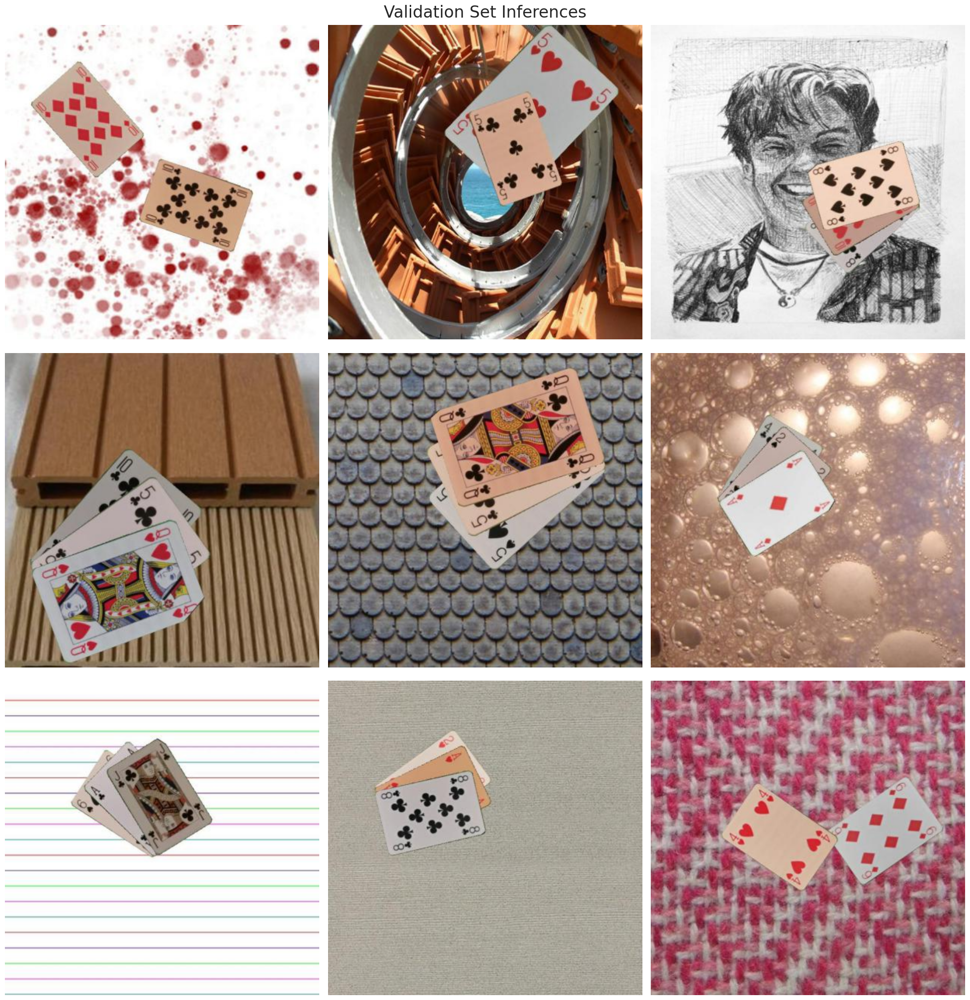

In [25]:
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(test_images_path, selected_images[i])
            # Load image
            image = cv2.imread(image_path)

            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = cv2.resize(image, (640, 640))  # Direct resize
                normalized_image = resized_image / 255.0  # Normalize


                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)

                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)

                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()


0: 640x640 (no detections), 271.1ms
Speed: 5.1ms preprocess, 271.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


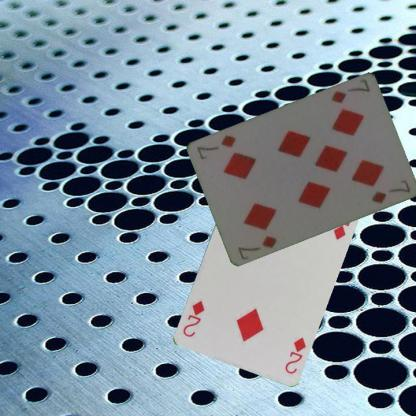

In [26]:
image_path = os.path.join(training_images_dir, '000958849_jpg.rf.080b6270c4d4ff260774c0bf5c780f44.jpg')
image = cv2.imread(image_path)

resized_image = cv2.resize(image, (640, 640))  # Direct resize
normalized_image = resized_image / 255.0  # Normalize

result_predict = Valid_model.predict(source = image, imgsz=(640), conf=0.5) #the default image size

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))